#### The other EDA Notebook is too large to display on Github. So here, I have broken up some of the EDA for display.

# VIRAT EDA part 1

# VIRAT Video Dataset
## Data Wrangling & EDA

### Data Sources

VIRAT dataset metadata: 
- https://viratdata.org/ </br>

VIRAT dataset:
- https://data.kitware.com/#collection/56f56db28d777f753209ba9f/folder/56f57e748d777f753209bed7
    - ~40GB, including annotations
    - Uploaded to my local machine

IARPA DIVA annotations:
- https://gitlab.kitware.com/viratdata/viratannotations
    - additional (better?) annotation files, added later in 2020

MEVA dataset*:
- https://mevadata.org/resources/README-meva-kf1-data.html
    - ~470GB
    - Available in an AWS S3 Bucket
        - *Currently not used by me

### In This Notebook:

1. Problem Statement
- 1.1 -- Project Description & Outline
2. Data Ingestion
- 2.1 -- VIRAT Video Dataset
3. Data Exploration
- 3.1 -- VIRAT Ground Video Files
- 3.2 -- Annotation Files EDA
- 3.3 -- Data Cleaning
4. IARPA DIVA Annotations
- 4.1 -- DIVA Annotation Files EDA
- 4.2 -- Data Formats
    - .types.yml
    - .geom.yml
    - .regions.yml
    - .activities.yml
- 4.3 -- Object Detection Verification
- 4.4 -- Object Track Verification
- 4.5 -- Event Detection Verification
- 4.6 -- Metrics

In [1]:
import os
import pandas as pd
import numpy as np
import cv2
import time
import random
import yaml

## 1. Problem Statement
Video surveillance could be made better by automated monitoring. While Object Detection Techniques are robust, Activity and Event Detection techniques lag behind. The purpose of this project is to research and develop a Computer Vision Pipeline which takes in video surveillance data and returns metrics on activities performed within the video (i.e. Entering Vehicle, Theft, Leaving Package Unattended, etc.).

#### 1.1 -- Project Description
Use the VIRAT Video Dataset to research and develop Event Detection techniques.

Background on VIRAT Video Dataset:

- The VIRAT Video Dataset collection work (version 2.0 released in 2011) is supported by Defense Advanced Research Projects Agency (DARPA) under Contract No. HR0011-08-C-0135 - https://viratdata.org/

- DIVA is a Research Program (begun in 2017) of the Intelligence Advanced Research Projects Agency (IARPA) which seeks to "create automatic activity detectors that can watch hours of video and highlight the few seconds when a person or vehicle does a specific activity"

    - "DIVA is a four-year program that began in September 2017 to develop activity detection capabilities that will have a significant impact on security video monitoring workflow by providing automated alerts, enabling a single operator to monitor a multi-camera network for user-defined threat activities or other activities of interest. DIVA will facilitate forensic analysis as well. To date, DIVA has built detectors for specific defined activities that surpass human detection capabilities, detecting more than twice as many activity instances as were found by a human control group consisting of crowdsourced labor. The ultimate objective is to detect 75 percent of activities while raising a false alarm only two percent of the time." - https://www.iarpa.gov/research-programs/diva
        

## 2. Data Ingestion

#### 2 -- VIRAT Video dataset:
- https://data.kitware.com/#collection/56f56db28d777f753209ba9f/folder/56f57e748d777f753209bed7
    - ~40GB, including annotations
    - Uploaded to my local machine


In [3]:
# view video files on my local
vid_dir = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original'
vid = os.listdir(vid_dir)
vid.sort()
vid[:4]

['VIRAT_S_000001.mp4',
 'VIRAT_S_000002.mp4',
 'VIRAT_S_000003.mp4',
 'VIRAT_S_000004.mp4']

In [6]:
# view annotation files on my local
ann_dir = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations'
ann = os.listdir(ann_dir)
ann.sort()
ann[:12]

['VIRAT_S_000001.viratdata.events.txt',
 'VIRAT_S_000001.viratdata.mapping.txt',
 'VIRAT_S_000001.viratdata.objects.txt',
 'VIRAT_S_000002.viratdata.events.txt',
 'VIRAT_S_000002.viratdata.mapping.txt',
 'VIRAT_S_000002.viratdata.objects.txt',
 'VIRAT_S_000003.viratdata.events.txt',
 'VIRAT_S_000003.viratdata.mapping.txt',
 'VIRAT_S_000003.viratdata.objects.txt',
 'VIRAT_S_000004.viratdata.events.txt',
 'VIRAT_S_000004.viratdata.mapping.txt',
 'VIRAT_S_000004.viratdata.objects.txt']

# 3. Data Exploration

Helper Functions

In [7]:
# function to view video
def view_video(video_path):
    print("press 'q' to quit...")
    # open Video Capture object
    cap = cv2.VideoCapture(video_path)
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        # Display the frame
        cv2.imshow(f'{vid[idx]}', frame)
        # Press 'q' to exit the loop
        if cv2.waitKey(1) & 0xFF == ord('q'):
            end_sequence(cap)
            break
    # end
    end_sequence(cap)

In [8]:
# function to end
def end_sequence(cap):
    # Release Video Capture
    cap.release()

    # Close cv2 window
    cv2.destroyAllWindows()
    cv2.waitKey(1)
    cv2.waitKey(1)
    cv2.waitKey(1)
    cv2.waitKey(1); # mac needs 4 loops of .waitKey(1) to to destroy windows..

#### 3.1 -- VIRAT Ground Video Files

In [9]:
idx = 14 # change idx to change video

video_path = vid_dir + '/' + vid[idx]  # get path

In [11]:
view_video(video_path) # play video

press 'q' to quit...


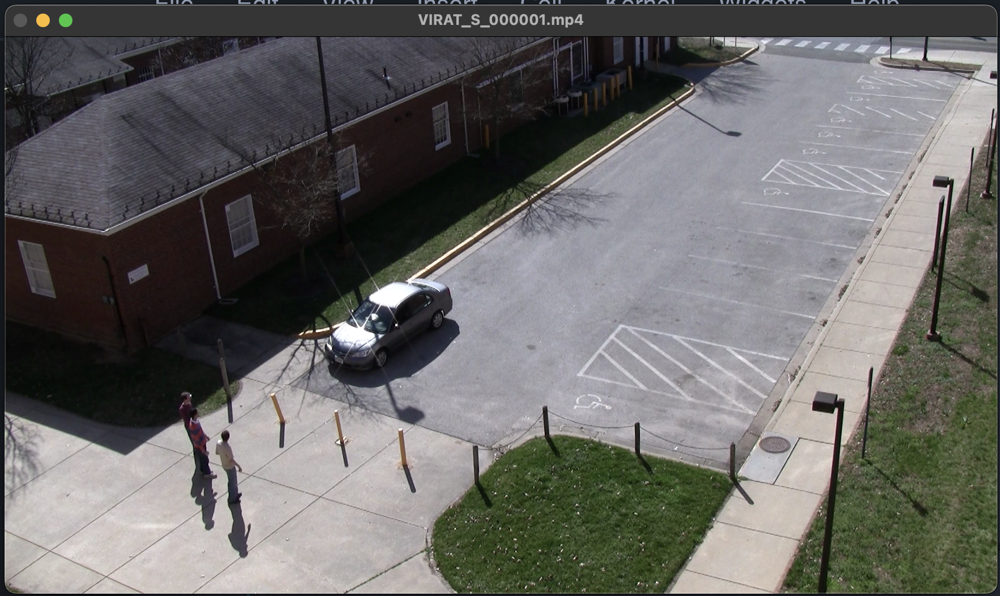

#### 3.2 -- Annotation Files EDA

#### Object Files
Most basic data structure is our Objects. Let's begin with __Object Files__

From Documentation:

#### Object file format

Files are named as '%s.viratdata.objects.txt'
Each line captures informabiont about a bounding box of an object (person/car etc) at the corresponding frame.
Each object track is assigned a unique 'object id' identifier. 
Note that:
- an object may be moving or static (e.g., parked car).
- an object track may be fragmented into multiple tracks.

Object File Columns
1. Object id        (a unique identifier of an object track. Unique within a file.)
2. Object duration  (duration of the object track)
3. Current frame    (corresponding frame number)
4. bbox lefttop x   (horizontal x coordinate of the left top of bbox, origin is lefttop of the frame)
5. bbox lefttop y   (vertical y coordinate of the left top of bbox, origin is lefttop of the frame)
6. bbox width       (horizontal width of the bbox)
7. bbox height      (vertical height of the bbox)
8. Objct Type       (object type)

Object Type ID (for column 8 above for object files)
1. person
2. car              (usually passenger vehicles such as sedan, truck)
3. vehicles         (vehicles other than usual passenger cars. Examples include construction vehicles)
4. object           (neither car or person, usually carried objects)
5. bike, bicylces   (may include engine-powered auto-bikes)

In [12]:
object_columns = ['Object_ID', 'Duration', 'Current_Frame', 'bbox_lefttop_x',
                  'bbox_lefttop_y', 'bbox_width', 'bbox_height', 'Object_Type']
objects = []
for i in range(len(ann)):
    if ann[i][-11:] == 'objects.txt':
        objects.append(ann[i])

In [13]:
idx = 0 # change idx to change objects.txt file

object_path = ann_dir + '/' + objects[idx]  # get path

In [14]:
object_df = pd.read_csv(object_path, sep=" ", names=object_columns, index_col=False)
object_df.head()

,Object_ID,Duration,Current_Frame,bbox_lefttop_x,bbox_lefttop_y,bbox_width,bbox_height,Object_Type
0,1,385,3455,1,663,76,132,1
1,1,385,3456,1,663,76,132,1
2,1,385,3457,1,663,76,132,1
3,1,385,3458,1,663,76,132,1
4,1,385,3459,1,663,76,132,1


#### Playback Video with Boxes

Some more helper functions

In [15]:
# function to draw bounding boxes
def draw_bounding_boxes(frame, boxes, color=(0, 255, 0), thickness=2):
    for box in boxes:
        x_min, y_min, x_max, y_max = box
        cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), color, thickness)
    return frame

In [16]:
# function to play video with bounding boxes
def playback_with_boxes(path, data):
    print("Press 'q' to quit playback")
    # preprocess data
    df_boxes = data.drop(['Object_ID', 'Duration', 'Object_Type'], axis=1)
    df_boxes['bbox_width'] = df_boxes['bbox_lefttop_x'] + df_boxes['bbox_width']
    df_boxes['bbox_height'] = df_boxes['bbox_lefttop_y'] + df_boxes['bbox_height']
    col_names = {'Current_Frame':'frame', 'bbox_lefttop_x':'x_min', 'bbox_width':'x_max', 
                 'bbox_lefttop_y':'y_min', 'bbox_height':'y_max'}
    df_boxes.rename(columns=col_names, inplace=True)
    # open Video Capture object
    cap = cv2.VideoCapture(path)
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        # get current frame, draw bounding boxes on it
        frame_number = int(cap.get(cv2.CAP_PROP_POS_FRAMES))
        frame_boxes = df_boxes[df_boxes['frame'] == frame_number][['x_min', 'y_min', 'x_max', 'y_max']].values
        frame_with_boxes = draw_bounding_boxes(frame, frame_boxes)
        # Display the frame
        cv2.imshow(f'{vid[idx]}', frame_with_boxes)
        # Press 'q' to exit the loop
        if cv2.waitKey(1) & 0xFF == ord('q'):
            end_sequence(cap)
            break
    # end
    end_sequence(cap)

In [17]:
idx = 0 # change idx to change video and objects.txt files

video_path = vid_dir + '/' + vid[idx]  # get path
object_path = ann_dir + '/' + objects[idx]  # get path
assert (video_path.split('/')[-1][:7] == object_path.split('/')[-1][:7]) # ensure files match
object_df = pd.read_csv(object_path, sep=" ", names=object_columns, index_col=False) # get data

In [18]:
playback_with_boxes(video_path, object_df)

Press 'q' to quit playback


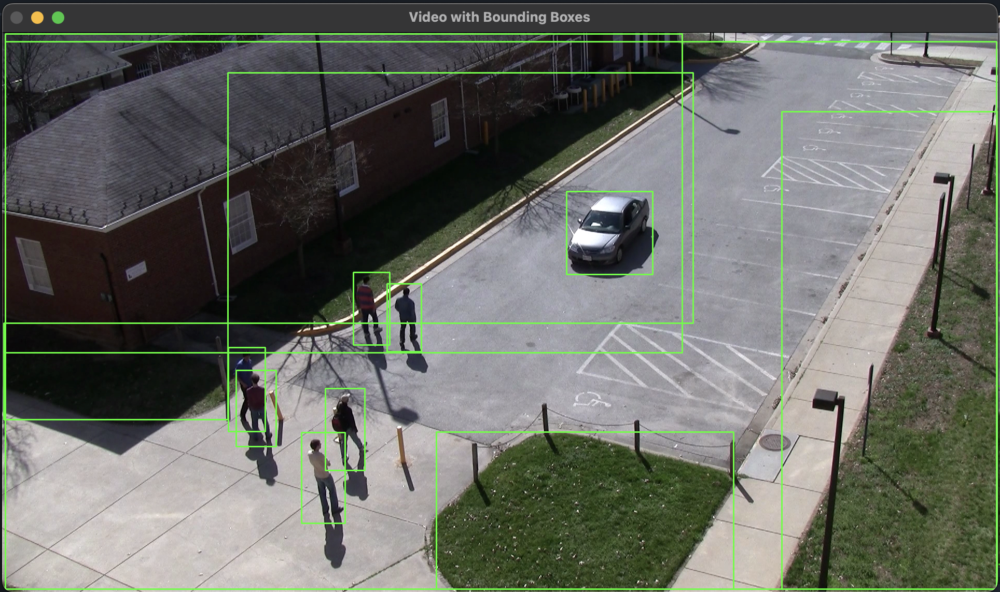

Correct boxes are present for people, but erroneous boxes exist

In [19]:
object_df.sort_values(by=['Current_Frame'])[:14]

,Object_ID,Duration,Current_Frame,bbox_lefttop_x,bbox_lefttop_y,bbox_width,bbox_height,Object_Type
385,3,4732,0,613,469,254,189,2
199326,31,20656,0,435,78,897,483,0
158124,29,20656,0,1503,153,416,921,0
96156,26,20656,0,6,3,1305,615,0
137468,28,20656,0,837,771,573,303,0
116812,27,20656,0,3,561,432,186,0
199327,31,20656,1,435,78,897,483,0
386,3,4732,1,612,468,255,190,2
158125,29,20656,1,1503,153,416,921,0
116813,27,20656,1,3,561,432,186,0


Note Objects with Duration 20565 (full length of video). It appears that Object_Type == 0 consist of the clutter on-screen.

### 3.3 Data Cleaning

#### View specific object
- Type 0 objects appear to be clutter.

In [20]:
# Function to display image (frame in middle of 'Duration')
# with bounding box of specific object
def display_this_object(obj, df, video_path, color=(0, 255, 0), thickness=2):
    """takes Object_ID, video path and full object dataframe,
    displays a single image with bounding box
    from first appearance of object in video"""
    
    # Get index of the middle frame of this object
    start_idx = pd.DataFrame(df[df['Object_ID'] == obj].iloc[0]).T.index.values[0]
    half_dur = pd.DataFrame(df[df['Object_ID'] == obj].iloc[0]).T['Duration'].values[0] * 0.5
    idx = int(half_dur + start_idx)
    # ALT:
    # uncomment for first frame
    ###idx = pd.DataFrame(df[df['Object_ID'] == obj].iloc[0]).T.index.values[0]
    
    # Get Bounding Box coordinates
    x_min = df['bbox_lefttop_x'][idx]
    y_min = df['bbox_lefttop_y'][idx]
    x_max = df['bbox_lefttop_x'][idx] + df['bbox_width'][idx]
    y_max = df['bbox_lefttop_y'][idx] + df['bbox_height'][idx]
    
    # Load the video
    cap = cv2.VideoCapture(video_path)

    # set frame position
    frame_index = df.iloc[idx]['Current_Frame']
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

    # Read the Frame
    ret, frame = cap.read()
    if not ret:
        print("Failed to read the frame")
        return
    if ret:
        # Draw bounding box on the frame
        cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), color, thickness)

        # Display the frame
        print("Object_ID: ", obj)
        print("Current_Frame: ", frame_index)
        cv2.imwrite("frame%i.jpg"%frame_index, frame)
        image = cv2.imread("frame%i.jpg"%frame_index)
        cv2.imshow("Object {} -- Frame {}".format(obj, frame_index), image)

        cv2.waitKey(5000) # wait 5 seconds

        # Delete the image
        if os.path.exists("frame%i.jpg"%frame_index):
            os.remove("frame%i.jpg"%frame_index)

        end_sequence(cap) # Terminate all windows

        return

In [21]:
video_path

'/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/VIRAT_S_000001.mp4'

In [22]:
# for first video, objects 26 - 31 were of Type 0
object_id = 31

display_this_object(object_id, object_df, video_path)

Object_ID:  31
Current_Frame:  10328


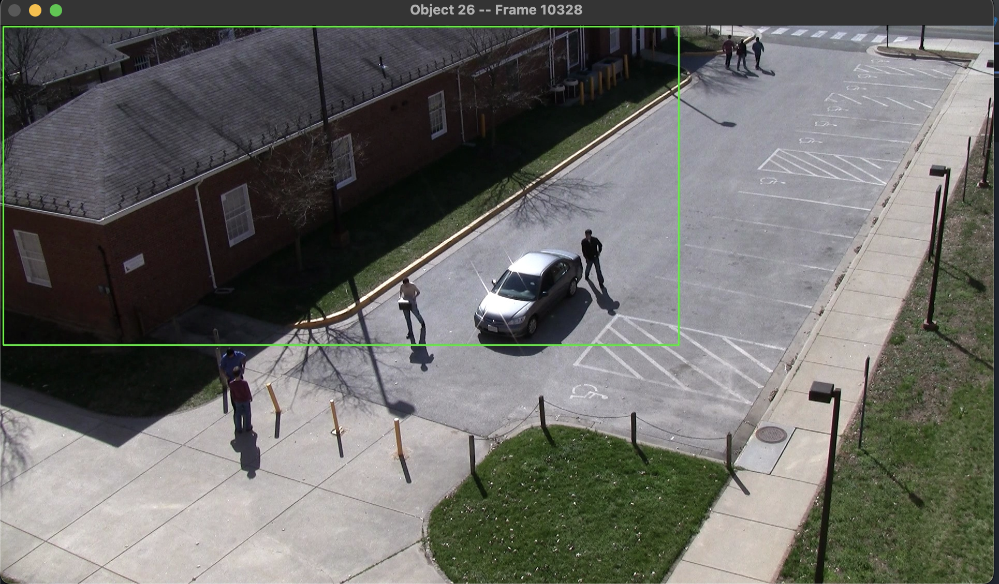

#### What are Type-0 objects in other scenes?

#### Getting all file names in lists

In [24]:
# get all video paths
all_video_paths = os.listdir('/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original')
all_video_paths.sort()
print(all_video_paths[:10])

['VIRAT_S_000001.mp4', 'VIRAT_S_000002.mp4', 'VIRAT_S_000003.mp4', 'VIRAT_S_000004.mp4', 'VIRAT_S_000006.mp4', 'VIRAT_S_000101.mp4', 'VIRAT_S_000102.mp4', 'VIRAT_S_000200_00_000100_000171.mp4', 'VIRAT_S_000200_01_000226_000268.mp4', 'VIRAT_S_000200_02_000479_000635.mp4']


In [26]:
# get all object paths
all_object_paths = []
obj_p = os.listdir('/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations')
for string in obj_p:
    if string[-11:] == 'objects.txt':
        all_object_paths.append(string)
all_object_paths.sort()
print(all_object_paths[:10])

['VIRAT_S_000001.viratdata.objects.txt', 'VIRAT_S_000002.viratdata.objects.txt', 'VIRAT_S_000003.viratdata.objects.txt', 'VIRAT_S_000004.viratdata.objects.txt', 'VIRAT_S_000006.viratdata.objects.txt', 'VIRAT_S_000101.viratdata.objects.txt', 'VIRAT_S_000102.viratdata.objects.txt', 'VIRAT_S_000200_00_000100_000171.viratdata.objects.txt', 'VIRAT_S_000200_01_000226_000268.viratdata.objects.txt', 'VIRAT_S_000200_03_000657_000899.viratdata.objects.txt']


#### Q: Why is the index 9 path different???
#### A: There is not a 1 to 1 mapping for videos and object annotation files. 
####    i.e. some videos have no matching objects.txt file

In [27]:
len(all_video_paths)

329

In [28]:
len(all_object_paths)

315

In [29]:
# To resolve this,
# let's take the unique identifier string from the video paths and map them
# this way, we know the mapping is correct, 
# and can observe when there is no object file for a video

In [30]:
all_video_paths[0][:14]

'VIRAT_S_000001'

In [31]:
all_video_paths[7][:23]

'VIRAT_S_000200_00_00010'

In [32]:
# Map identifier strings (keys) to video and object filepaths

all_keys = {}
# first 7 videos have shorter identifier sequences
for i in range(7):
    key = all_video_paths[i][:14]
    keyed_video = all_video_paths[i]
    keyed_object = None
    for j in range(0, len(all_object_paths)):
        if all_object_paths[j][:14] == key:
            keyed_object = all_object_paths[j]
    all_keys[key] = [keyed_video, keyed_object]
# rest are longer
for i in range(7, len(all_video_paths)):
    key = all_video_paths[i][:23]
    keyed_video = all_video_paths[i]
    keyed_object = None
    for j in range(0, len(all_object_paths)):
        if all_object_paths[j][:23] == key:
            keyed_object = all_object_paths[j]
    all_keys[key] = [keyed_video, keyed_object]

In [33]:
len(all_keys) # should be same as len(all_video_paths) (329)

329

In [34]:
# for usage, make a list of the keys
key_list = []
for key in all_keys.keys():
    key_list.append(key)

In [35]:
# cool
all_keys[key_list[8]]

['VIRAT_S_000200_01_000226_000268.mp4',
 'VIRAT_S_000200_01_000226_000268.viratdata.objects.txt']

In [37]:
# let's now count the type-0 objects for the first 5 videos:

# establish constants
vid_prefix = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/'
obj_prefix = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/'
object_columns = ['Object_ID', 'Duration', 'Current_Frame', 'bbox_lefttop_x',
                  'bbox_lefttop_y', 'bbox_width', 'bbox_height', 'Object_Type']

for i in range(5):
    # get video and object paths
    video_path = vid_prefix + all_keys[key_list[i]][0]
    object_path = obj_prefix + all_keys[key_list[i]][1]
    # get dataframe from object path
    df_obj = pd.read_csv(object_path, sep=" ", names=object_columns, index_col=False)
    # count unique values of objects with type 0
    type0_objs = df_obj[df_obj['Object_Type'] == 0]['Object_ID'].unique()
    
    # print our results
    print(object_path)
    print(type0_objs)

/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000001.viratdata.objects.txt
[26 27 28 29 30 31]
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000002.viratdata.objects.txt
[14 15 16 17 18 19 20 21]
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000003.viratdata.objects.txt
[15 16 17 18 19 20 21 22 23]
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000004.viratdata.objects.txt
[]
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000006.viratdata.objects.txt
[]


There was an error code in processing the data to a pandas DataFrame for line 115562 of the .objects.txt file for VIRAT_S_000002

Let's take a look and see what the issue in the data is:

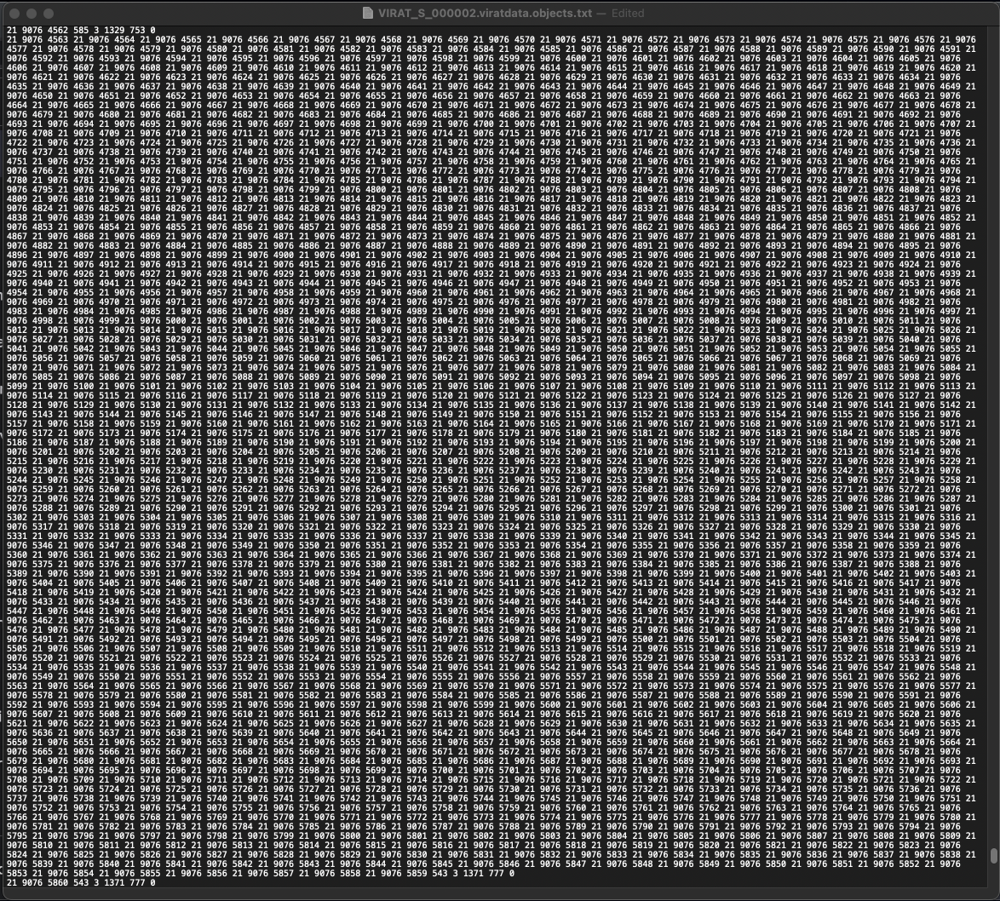

#### Discovered issue: 
Object_ID 21 of this objects.txt file is missing the last 5 columns (bbox coords, and object_id) as well as the 'Enter' key 

#### Resolution:
I'm going to remove these records, since they appear to be corrupted data. Also, the object is of type 0 and is likely to be removed for irrelevance.

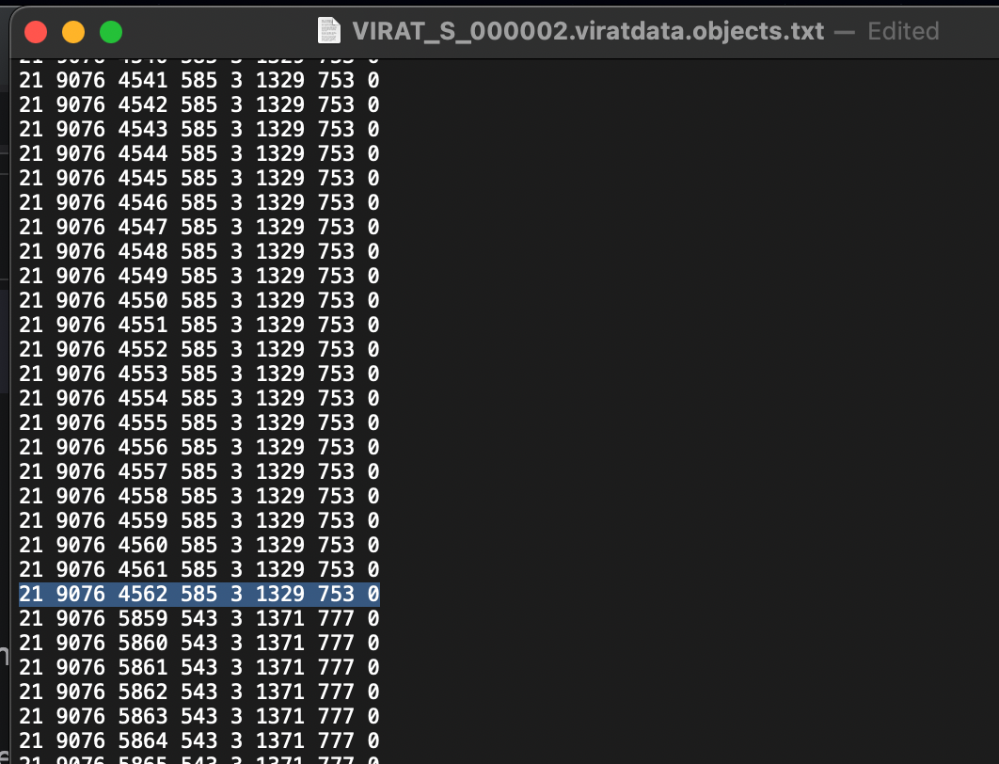

OK, trying again. Let's see how many type-0 objects there are for the first 5 videos:

In [39]:
# displaycount the type-0 objects for the first 5 videos:

# establish constants
vid_prefix = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/'
obj_prefix = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/'
object_columns = ['Object_ID', 'Duration', 'Current_Frame', 'bbox_lefttop_x',
                  'bbox_lefttop_y', 'bbox_width', 'bbox_height', 'Object_Type']

for i in range(5):
    # get video and object paths
    video_path = vid_prefix + all_keys[key_list[i]][0]
    object_path = obj_prefix + all_keys[key_list[i]][1]
    # get dataframe from object path
    df_obj = pd.read_csv(object_path, sep=" ", names=object_columns, index_col=False)
    # count unique values of objects with type 0
    type0_objs = df_obj[df_obj['Object_Type'] == 0]['Object_ID'].unique()
    
    # print our results
    print(video_path)
    print(object_path)
    print(len(type0_objs), " type-0 objects. Object_IDs: \t", type0_objs)

/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/VIRAT_S_000001.mp4
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000001.viratdata.objects.txt
6  type-0 objects. Object_IDs: 	 [26 27 28 29 30 31]
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/VIRAT_S_000002.mp4
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000002.viratdata.objects.txt
8  type-0 objects. Object_IDs: 	 [14 15 16 17 18 19 20 21]
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/VIRAT_S_000003.mp4
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000003.viratdata.objects.txt
9  type-0 objects. Object_IDs: 	 [15 16 17 18 19 20 21 22 23]
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/VIRAT_S_000004.mp4
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000004.viratdata.objects.txt
0  type-0 objects. Object_IDs: 	 []
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dat

### Ok, now let's see these objects

In [40]:
# Variant to display using first frame instead of middle frame

def display_this_object_ff(obj, df, path=video_path, color=(0, 255, 0), thickness=2):
    """takes Object_ID, video path and full object dataframe,
    displays a single image with bounding box
    from first appearance of object in video"""
    
    # Get index of the middle frame of this object
    ###start_idx = pd.DataFrame(df[df['Object_ID'] == obj].iloc[0]).T.index.values[0]
    ###half_dur = pd.DataFrame(df[df['Object_ID'] == obj].iloc[0]).T['Duration'].values[0] * 0.5
    ###idx = int(half_dur + start_idx)
    # ALT:
    # uncomment for first frame
    idx = pd.DataFrame(df[df['Object_ID'] == obj].iloc[0]).T.index.values[0]
    
    # Get Bounding Box coordinates
    x_min = df['bbox_lefttop_x'][idx]
    y_min = df['bbox_lefttop_y'][idx]
    x_max = df['bbox_lefttop_x'][idx] + df['bbox_width'][idx]
    y_max = df['bbox_lefttop_y'][idx] + df['bbox_height'][idx]
    
    # Load the video
    cap = cv2.VideoCapture(video_path)

    # set the frame position
    frame_index = df.iloc[idx]['Current_Frame']
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

    # Read the Frame
    ret, frame = cap.read()
    if not ret:
        print("Failed to read the frame")
        return
    if ret:
        # Draw bounding box on the frame
        cv2.rectangle(frame, (x_min, y_min), (x_max, y_max), color, thickness)

        # Display the frame
        print("Object_ID: ", obj)
        print("Current_Frame: ", frame_index)
        cv2.imwrite("frame%i.jpg"%frame_index, frame)
        image = cv2.imread("frame%i.jpg"%frame_index)
        vid_index = all_keys[key_list[i]][0].split('.')[0] # !!!! THIS BREAKS IT IF NOT IN i LOOP
        cv2.imshow("Object {} -- Frame {} -- Video {}".format(obj, frame_index, vid_index), image)

        cv2.waitKey(2000) # wait 2 seconds

        # Delete the image
        if os.path.exists("frame%i.jpg"%frame_index):
            os.remove("frame%i.jpg"%frame_index)

        end_sequence(cap) # Terminate all windows

        return

In [41]:
for i in range(2, 4):
    # get video and object paths
    video_path = vid_prefix + all_keys[key_list[i]][0]
    object_path = obj_prefix + all_keys[key_list[i]][1]
    
    # get dataframe from object path
    df_obj = pd.read_csv(object_path, sep=" ", names=object_columns, index_col=False)
    
    # print where we are
    print(video_path)
    print(object_path)
    
    # view these objects in turn
    type0_objs = df_obj[df_obj['Object_Type'] == 0]['Object_ID'].unique()
    for obj in type0_objs:
        display_this_object_ff(obj, df_obj)
    

/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/VIRAT_S_000003.mp4
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000003.viratdata.objects.txt
Object_ID:  15
Current_Frame:  0
Object_ID:  16
Current_Frame:  0
Object_ID:  17
Current_Frame:  0
Object_ID:  18
Current_Frame:  0
Object_ID:  19
Current_Frame:  0
Object_ID:  20
Current_Frame:  0
Object_ID:  21
Current_Frame:  0
Object_ID:  22
Current_Frame:  0
Object_ID:  23
Current_Frame:  0
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/VIRAT_S_000004.mp4
/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/VIRAT_S_000004.viratdata.objects.txt


### Let's count the type-0 objects for all videos
- This will also help to determine if there is more corrupted data

In [42]:
# displaycount the type-0 objects for all videos:

# establish constants
vid_prefix = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/videos_original/'
obj_prefix = '/Users/p/Documents/Code/VIRAT/VIRAT_Ground_Dataset/annotations/'
object_columns = ['Object_ID', 'Duration', 'Current_Frame', 'bbox_lefttop_x',
                  'bbox_lefttop_y', 'bbox_width', 'bbox_height', 'Object_Type']

# store troublesome object data
corrupted = []
count = 0
type0s = []

# Do all the stuff
for i in range(len(all_video_paths)):
    # get video and object paths
    video_suffix = all_keys[key_list[i]][0]
    object_suffix = all_keys[key_list[i]][1]
    video_path = vid_prefix + video_suffix
    # if the object file doesn't exist for this video, print failure
    if object_suffix == None:
        print("*** VIDEO HAS NO MATCHED OBJECT FILE: ", video_suffix)
        count += 1
    else:
        object_path = obj_prefix + object_suffix
        try:
            # get dataframe from object path
            df_obj = pd.read_csv(object_path, sep=" ", names=object_columns, index_col=False)
            # list unique IDs of objects with type 0
            type0_objs = df_obj[df_obj['Object_Type'] == 0]['Object_ID'].unique()

            # success! print our results
            print(object_suffix)
            print(len(type0_objs), "type-0 objects. Object_IDs: \t", type0_objs)
            
            # save positions of videos with type-0 objects
            if len(type0_objs) > 0:
                type0s.append(i)
        # if there was some issue with handling the data in a pandas dataframe
        except:
            print("*** FAILED TO EXTRACT DATA: ", object_suffix)
            corrupted.append(object_path)

VIRAT_S_000001.viratdata.objects.txt
6 type-0 objects. Object_IDs: 	 [26 27 28 29 30 31]
VIRAT_S_000002.viratdata.objects.txt
8 type-0 objects. Object_IDs: 	 [14 15 16 17 18 19 20 21]
VIRAT_S_000003.viratdata.objects.txt
9 type-0 objects. Object_IDs: 	 [15 16 17 18 19 20 21 22 23]
VIRAT_S_000004.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_000006.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_000101.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_000102.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_000200_00_000100_000171.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_000200_01_000226_000268.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
*** VIDEO HAS NO MATCHED OBJECT FILE:  VIRAT_S_000200_02_000479_000635.mp4
VIRAT_S_000200_03_000657_000899.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_000200_04_000937_001443.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []

VIRAT_S_010107_01_000068_000196.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010107_02_000282_000312.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010108_01_000570_000718.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010108_02_000800_000960.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010109_00_000000_000063.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010109_04_000487_000538.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010109_05_000602_000678.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010109_07_000876_000910.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010109_08_000952_001011.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010110_00_000000_000021.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010110_02_000513_000566.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_010110_03_000

VIRAT_S_040001_00_000035_000319.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040001_01_000448_001101.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040001_02_001102_001530.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040001_03_001531_001595.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040002_03_001525_001569.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040003_00_000000_000072.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040003_01_000083_000193.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040003_02_000197_000552.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040003_03_000577_000741.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040003_04_000758_001118.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040003_05_001123_001437.viratdata.objects.txt
0 type-0 objects. Object_IDs: 	 []
VIRAT_S_040003_06_001

In [44]:
for i in type0s:
    print(all_video_paths[i])

VIRAT_S_000001.mp4
VIRAT_S_000002.mp4
VIRAT_S_000003.mp4
VIRAT_S_000206_07_001501_001600.mp4
VIRAT_S_050202_04_000690_000750.mp4
VIRAT_S_050203_07_001288_001531.mp4
VIRAT_S_050203_09_001960_002083.mp4


In [45]:
type0s

[0, 1, 2, 37, 302, 312, 314]

In [46]:
count

14

#### Clean Corrupted Data Files:

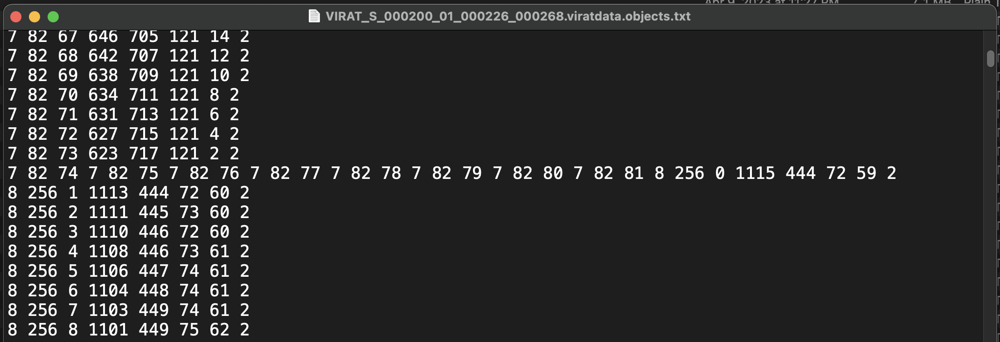

After:

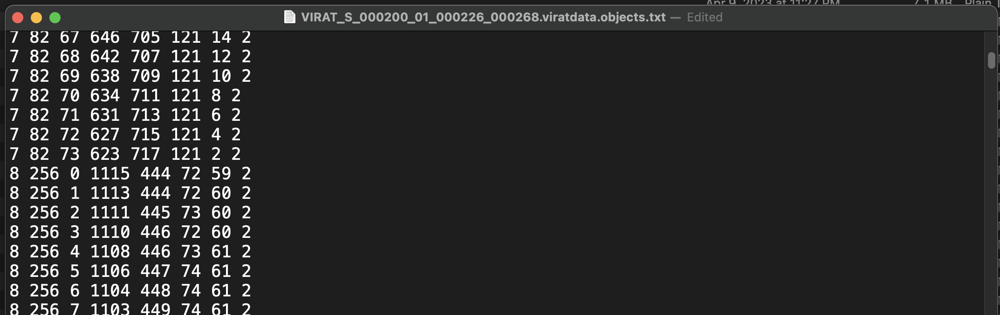

The following were modified in similar fashion to the above:

['/Users/p/Documents/Code/VIRAT/VIRAT Ground Dataset/annotations/VIRAT_S_000200_01_000226_000268.viratdata.objects.txt',
 '/Users/p/Documents/Code/VIRAT/VIRAT Ground Dataset/annotations/VIRAT_S_000206_09_001714_001851.viratdata.objects.txt',
 '/Users/p/Documents/Code/VIRAT/VIRAT Ground Dataset/annotations/VIRAT_S_050201_07_001348_001458.viratdata.objects.txt',
 '/Users/p/Documents/Code/VIRAT/VIRAT Ground Dataset/annotations/VIRAT_S_050203_07_001288_001531.viratdata.objects.txt',
 '/Users/p/Documents/Code/VIRAT/VIRAT Ground Dataset/annotations/VIRAT_S_050203_09_001960_002083.viratdata.objects.txt']

#### Summary

- 329 total videos
- 14 videos don't have corresponding objects.txt file
- 5 + 1 objects.txt files are corrupted in some way that requires cleaning (1 already cleaned)
- 5 object.txt files with "Object_Type" == 0 objects. These which appear to be mistakes. Or, Possibly used for Events? Need to look into this.